# Summary of clusters

## Basic stats of all features in clusters for each clustering method

In [ ]:
for i, cluster_data in enumerate(cluster_datasets):

    # print clustering method
    print("clustering method:", cluster_methods[i])

    # summarize each cluster's features
    for cluster in np.sort(cluster_data["cluster"].unique()):
        print("cluster:", cluster)

        # filter for cluster
        selected_cluster_data = cluster_data[cluster_data["cluster"] == cluster]

        # get features
        features_selected_cluster = selected_cluster_data.loc[:, selected_cluster_data.columns != "cluster"]

        # summarise features of selected cluster
        print(features_selected_cluster.describe())
        print()

    # for better overview in output
    print()
    print()

clustering method: removed NAN
cluster: 0
        patient_age  patient_gender  \
count  14493.000000    14493.000000   
mean       4.563996        0.528462   
std        1.365456        0.499206   
min        3.000000        0.000000   
25%        3.000000        0.000000   
50%        4.000000        1.000000   
75%        6.000000        1.000000   
max        7.000000        1.000000   

       CC33 - Fever or convulsions or lethargy - 7391  
count                                         14493.0  
mean                                              0.0  
std                                               0.0  
min                                               0.0  
25%                                               0.0  
50%                                               0.0  
75%                                               0.0  
max                                               0.0  

cluster: 1
        patient_age  patient_gender  \
count  26597.000000    26597.000000   
mean       0

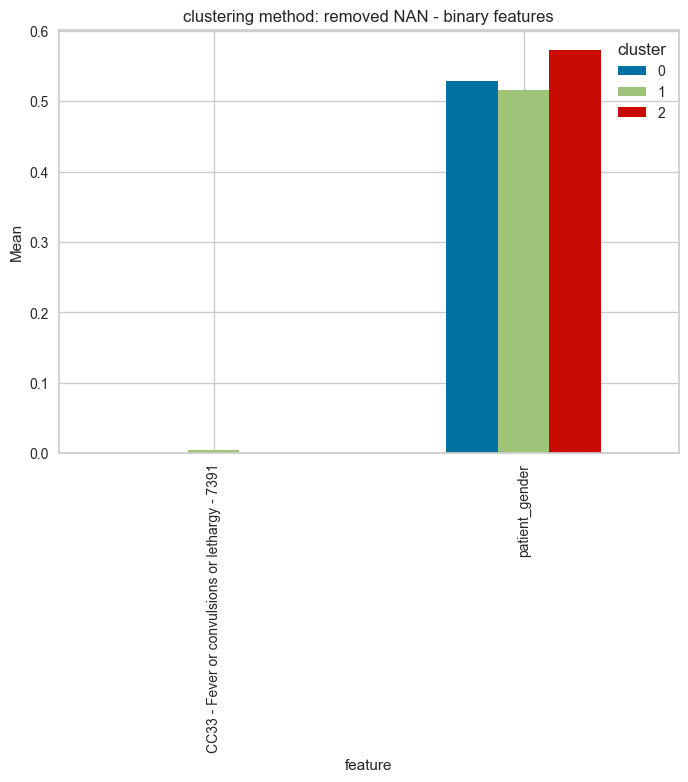

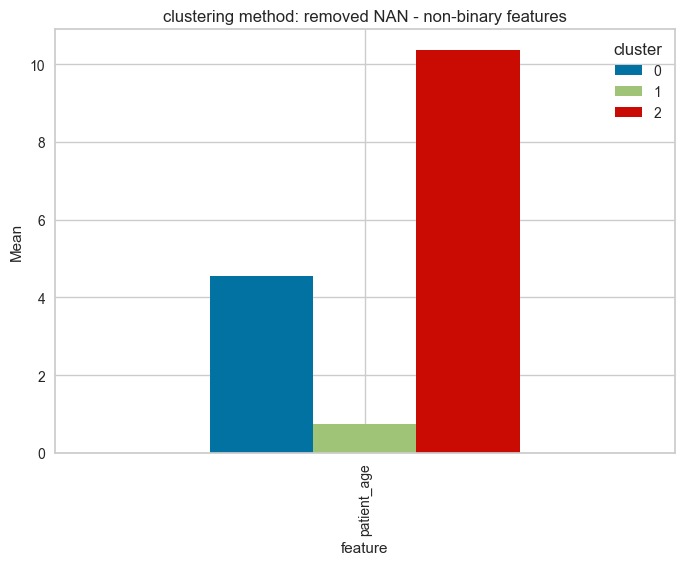

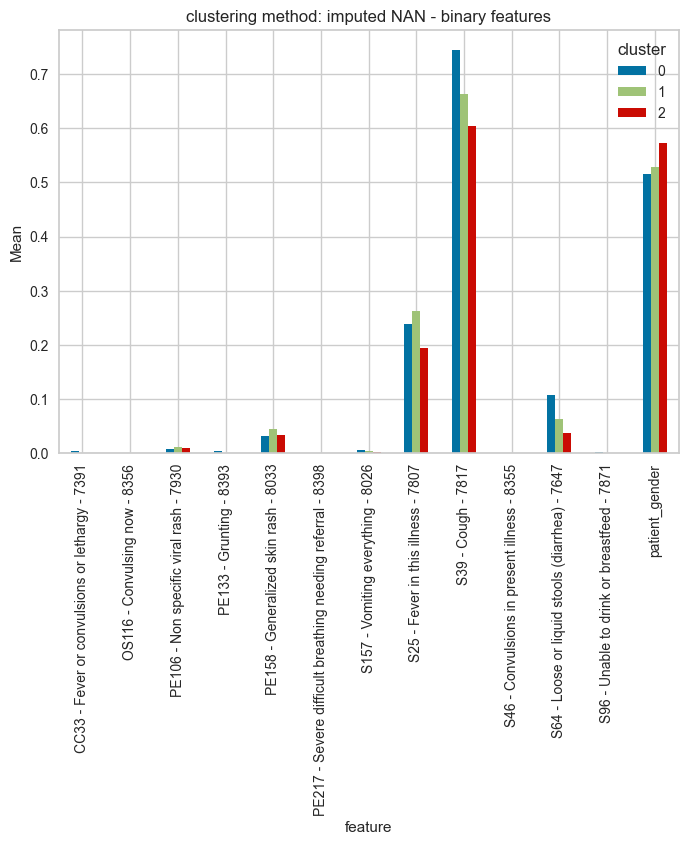

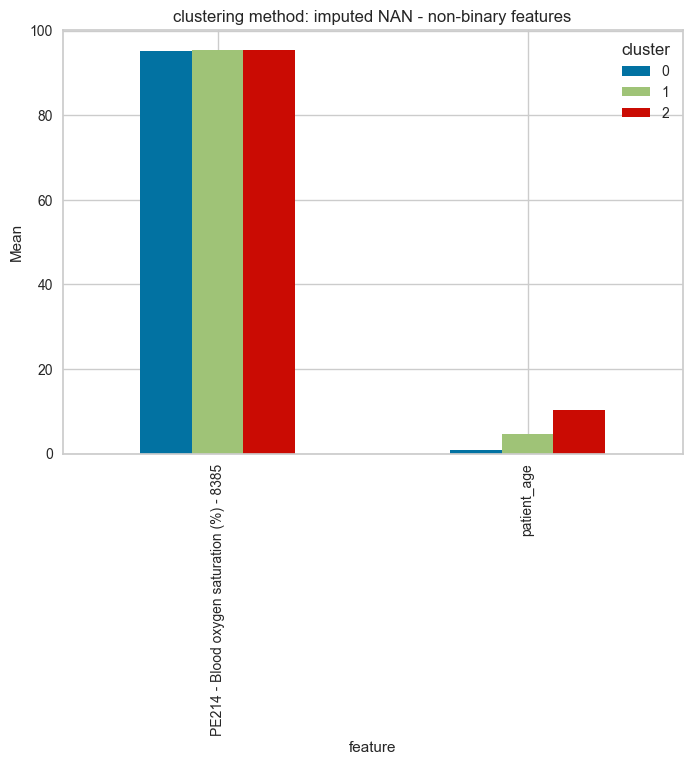

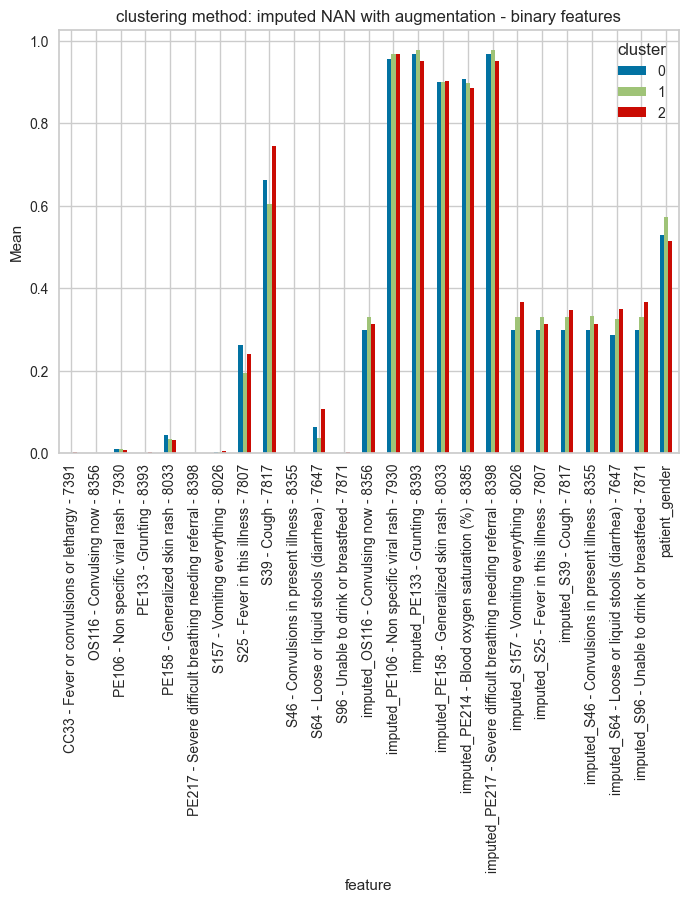

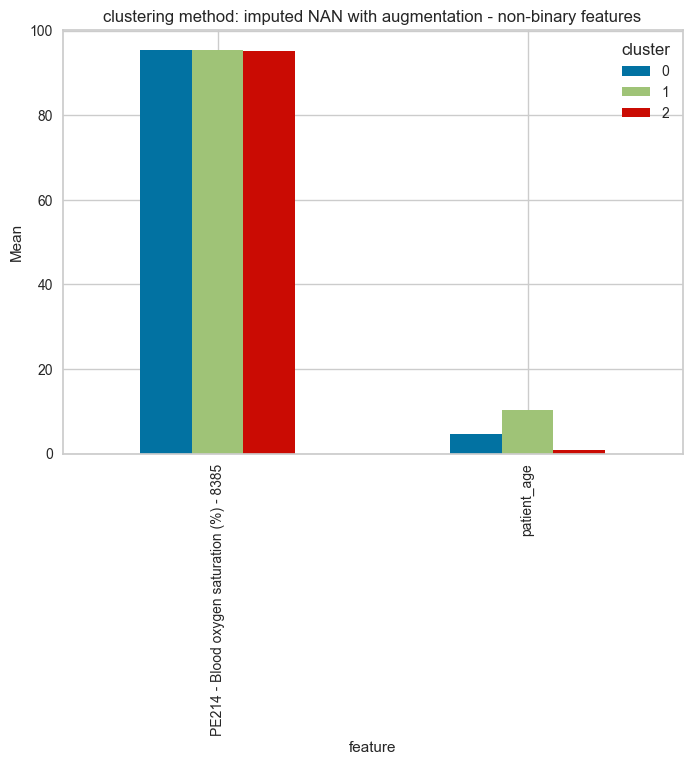

In [ ]:
for i, cluster_data in enumerate(cluster_datasets):

    title = "clustering method: " + cluster_methods[i]

    features_temp = cluster_data.columns != "cluster"

    # trying this: https://stats.stackexchange.com/questions/520731/how-to-plot-binary-vs-categorical-nominal-data
    binary_features_names_temp = cluster_data.nunique().loc[lambda x : x <= 2].index.tolist()
    binary_data_temp = cluster_data[binary_features_names_temp + ["cluster"]]
    non_binary_data_temp = cluster_data.loc[:, ~cluster_data.columns.isin(binary_features_names_temp)]

    # summarize each cluster's features
    for binary_feature in [True, False]:
        if binary_feature:
            binary_data_temp.melt(
                id_vars=["cluster"],
                var_name="feature", 
                value_name="value"
            ).pivot_table(
                index="feature", 
                columns="cluster", 
                values="value", 
                aggfunc=np.mean
            ).plot(
                kind="bar", 
                ylabel="Mean",
                title = title + " - binary features"
            )
        else: 
            non_binary_data_temp.melt(
                id_vars=["cluster"],
                var_name="feature", 
                value_name="value"
            ).pivot_table(
                index="feature", 
                columns="cluster", 
                values="value", 
                aggfunc=np.mean
            ).plot(
                kind="bar", 
                ylabel="Mean",
                title = title + " - non-binary features"
            )

## Analysis of missingness in clusters for each clustering method
To do so...
1. count features' missing values per cluster for each clustering method
2. 

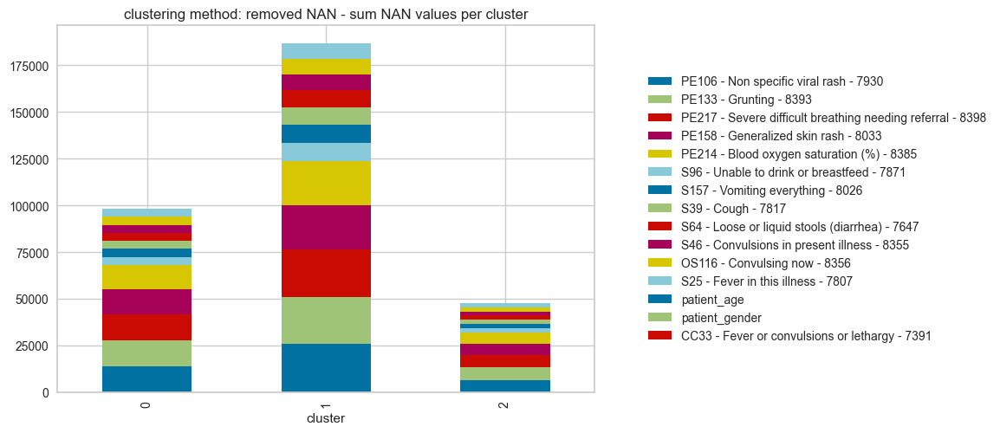

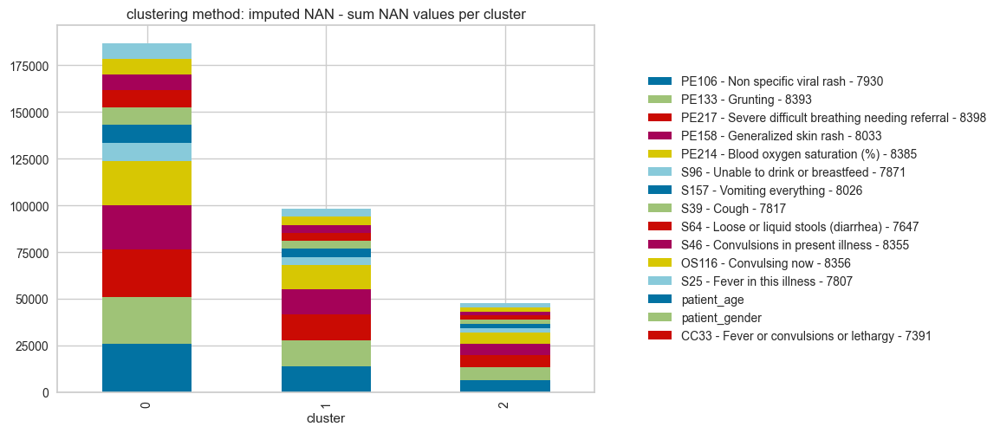

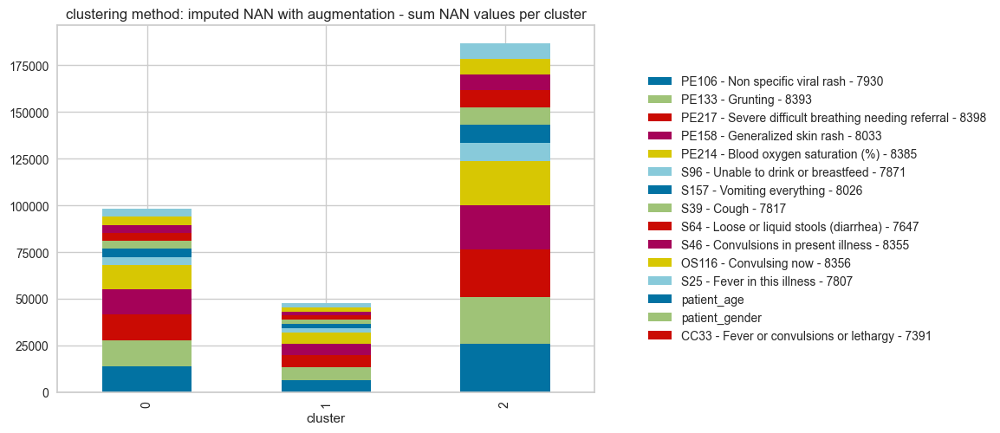

In [ ]:
for i, cluster_data in enumerate(cluster_datasets):

    title = "clustering method: " + cluster_methods[i]
    
    # shadow matrix: whenever original features holds nan value the shadow matrix will have a 1 at this element position else 0
    shadow_matrix_temp = shadow_matrix_features
    shadow_matrix_temp["cluster"] = cluster_data["cluster"]

    # group by cluster and count missing values
    shadow_matrix_temp.groupby("cluster").sum().plot(
        kind="bar", 
        title=title + " - sum NAN values per cluster", 
        #subplots=True, 
        #sort_columns=True,
        stacked=True
    )
    plt.legend(loc="center right", bbox_to_anchor=(1.75, 0.5))

### Takeaways
- the number of nan values from the original features in each cluster signifies something different for each clustering method:
    - "CLUSTERING WITH NO NAN VALUES": number of nan-values per feature = number of observations per feature which missed for clustering decision
    - "CLUSTERING WITH IMPUTED VALUES" number of nan-values per feature = number of imputations per features
    - "CLUSTERING WITH IMPUTED VALUES AND AN EXTRA BINARY COLUMN FOR TRACKING IMPUTATION" number of nan-values per feature = number of imputations per feature and sum of augmented column of respectively imputed feature
- for each clustering method it seems that the cluster with the most NAN values in total also contains the most missing values for each feature respectively (analog is the case for the cluster with least missing values). One thus can draw that missingness of each feature has an impact on the clustering decision

## Missingness as a significant explanation for clustering decision per cluster of each clustering method 
To do so, logistic regression is run on every cluster for each clustering method with shadow matrix as input and a binary output which informs whether consultation is part of respective cluster or not
    - while doing so dependent variables are checked for perfect separation, i. e. are there dependent variables which perfectly explain the output? 

In [ ]:
import statsmodels.api as sm

# variables to store results
mths = []
clustrs = []
fts = []
coefs = []
pvals = []

# perform binary logistic regression for each clustering method's clusters: does missingness explain the class label
for i, cluster_data in enumerate(cluster_datasets):

    # perform logistic regression for each cluster with shadow matrix as input
    for cluster in np.sort(cluster_data["cluster"].unique()):
        print("cluster:", cluster)

        # make cluster column binary: 1 means that consultation is part of respective cluster and 0 not
        y = [1 if label == cluster else 0 for label in cluster_data["cluster"]]

        # check for perfect separation between features in shadow matrix and output y
        perfect_features = []
        for feature in shadow_matrix_features.columns:
            if pd.Series(y).equals(shadow_matrix_features[feature]):
                perfect_features.append(feature)
        print("perfectly separated features for cluster:", perfect_features)

        # remove perfectly separated features to avoid conversion issues
            #cleaned_shadow_matrix_features = shadow_matrix_features.loc[:, ~shadow_matrix_features.columns.isin(perfect_features)]
            #print("log regression with features:", shadow_matrix_features.columns)

        # perform logistic regression for each feature in the shadow matrix : does missingness explain the cluster label? yes, if p-values are high
        for ft in shadow_matrix_features:
            log_reg = sm.Logit(y, shadow_matrix_features[ft]).fit() #method='bfgs' essential to avoid SingleMatrix error

            # store results
            fts.append(ft)
            mths.append(cluster_methods[i])
            coefs.append(log_reg.params)
            pvals.append(log_reg.pvalues)

# for better overview in output
effect_missingness_on_clustering = pd.DataFrame({"method":mths, "cluster":clustrs, "feature":fts, "coefficient":coefs, "p_value":pvals})

clustering method: removed NAN
cluster: 0
perfectly separated features for cluster: []
Optimization terminated successfully.
         Current function value: 0.000065
         Iterations: 22
         Function evaluations: 23
         Gradient evaluations: 23
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                47886
Model:                          Logit   Df Residuals:                    47873
Method:                           MLE   Df Model:                           12
Date:                Tue, 25 Apr 2023   Pseudo R-squ.:                  0.9999
Time:                        18:55:00   Log-Likelihood:                -3.1153
converged:                       True   LL-Null:                       -29359.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                                                 coef    std err          z      P>|z|      [

c:\Users\sidla\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\base\model.py:592: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


perfectly separated features for cluster: []
         Current function value: 0.019093
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                47886
Model:                          Logit   Df Residuals:                    47873
Method:                           MLE   Df Model:                           12
Date:                Tue, 25 Apr 2023   Pseudo R-squ.:                  0.9722
Time:                        18:55:01   Log-Likelihood:                -914.27
converged:                      False   LL-Null:                       -32897.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                                                 coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------

c:\Users\sidla\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\base\model.py:592: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
c:\Users\sidla\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


perfectly separated features for cluster: []
         Current function value: 0.401349
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                47886
Model:                          Logit   Df Residuals:                    47873
Method:                           MLE   Df Model:                           12
Date:                Tue, 25 Apr 2023   Pseudo R-squ.:                 0.01735
Time:                        18:55:01   Log-Likelihood:                -19219.
converged:                      False   LL-Null:                       -19558.
Covariance Type:            nonrobust   LLR p-value:                1.731e-137
                                                                 coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------

c:\Users\sidla\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\base\model.py:592: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
c:\Users\sidla\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


perfectly separated features for cluster: []
         Current function value: 0.019093
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                47886
Model:                          Logit   Df Residuals:                    47873
Method:                           MLE   Df Model:                           12
Date:                Tue, 25 Apr 2023   Pseudo R-squ.:                  0.9722
Time:                        18:55:02   Log-Likelihood:                -914.27
converged:                      False   LL-Null:                       -32897.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                                                 coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------

c:\Users\sidla\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\base\model.py:592: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
c:\Users\sidla\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


perfectly separated features for cluster: []
Optimization terminated successfully.
         Current function value: 0.000065
         Iterations: 22
         Function evaluations: 23
         Gradient evaluations: 23
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                47886
Model:                          Logit   Df Residuals:                    47873
Method:                           MLE   Df Model:                           12
Date:                Tue, 25 Apr 2023   Pseudo R-squ.:                  0.9999
Time:                        18:55:03   Log-Likelihood:                -3.1153
converged:                       True   LL-Null:                       -29359.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                                                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------

c:\Users\sidla\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\base\model.py:592: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


perfectly separated features for cluster: []
         Current function value: 0.401349
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                47886
Model:                          Logit   Df Residuals:                    47873
Method:                           MLE   Df Model:                           12
Date:                Tue, 25 Apr 2023   Pseudo R-squ.:                 0.01735
Time:                        18:55:04   Log-Likelihood:                -19219.
converged:                      False   LL-Null:                       -19558.
Covariance Type:            nonrobust   LLR p-value:                1.731e-137
                                                                 coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------

c:\Users\sidla\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\base\model.py:592: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
c:\Users\sidla\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


perfectly separated features for cluster: []
Optimization terminated successfully.
         Current function value: 0.000065
         Iterations: 22
         Function evaluations: 23
         Gradient evaluations: 23
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                47886
Model:                          Logit   Df Residuals:                    47873
Method:                           MLE   Df Model:                           12
Date:                Tue, 25 Apr 2023   Pseudo R-squ.:                  0.9999
Time:                        18:55:05   Log-Likelihood:                -3.1153
converged:                       True   LL-Null:                       -29359.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                                                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------

c:\Users\sidla\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\base\model.py:592: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


perfectly separated features for cluster: []
         Current function value: 0.401349
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                47886
Model:                          Logit   Df Residuals:                    47873
Method:                           MLE   Df Model:                           12
Date:                Tue, 25 Apr 2023   Pseudo R-squ.:                 0.01735
Time:                        18:55:05   Log-Likelihood:                -19219.
converged:                      False   LL-Null:                       -19558.
Covariance Type:            nonrobust   LLR p-value:                1.731e-137
                                                                 coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------

c:\Users\sidla\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\base\model.py:592: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
c:\Users\sidla\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


perfectly separated features for cluster: []
         Current function value: 0.019093
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                47886
Model:                          Logit   Df Residuals:                    47873
Method:                           MLE   Df Model:                           12
Date:                Tue, 25 Apr 2023   Pseudo R-squ.:                  0.9722
Time:                        18:55:06   Log-Likelihood:                -914.27
converged:                      False   LL-Null:                       -32897.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                                                 coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------

c:\Users\sidla\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\base\model.py:592: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
c:\Users\sidla\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


### Takeaways
- correlation of features' missingness does not make it possible to create a logistic regression model for each cluster that can be trusted. The multicorreality of every features' missingness leads to:
    - HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
    - ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "

## Consultations per cluster for each clustering method

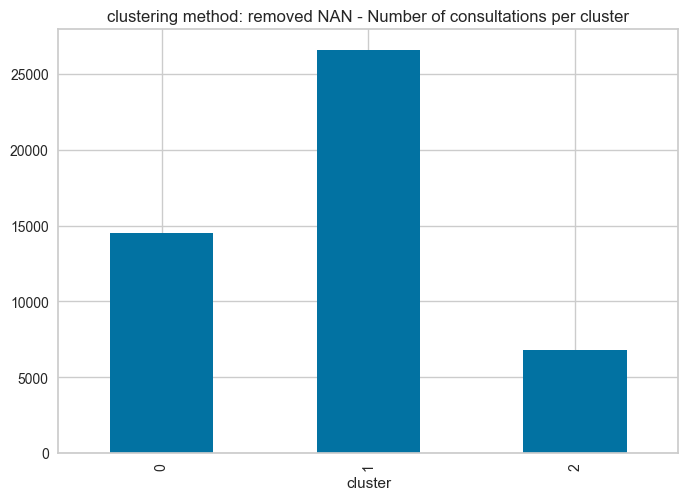

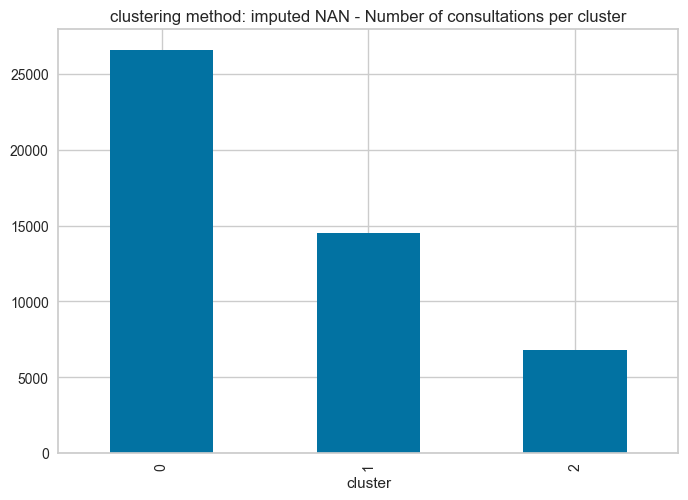

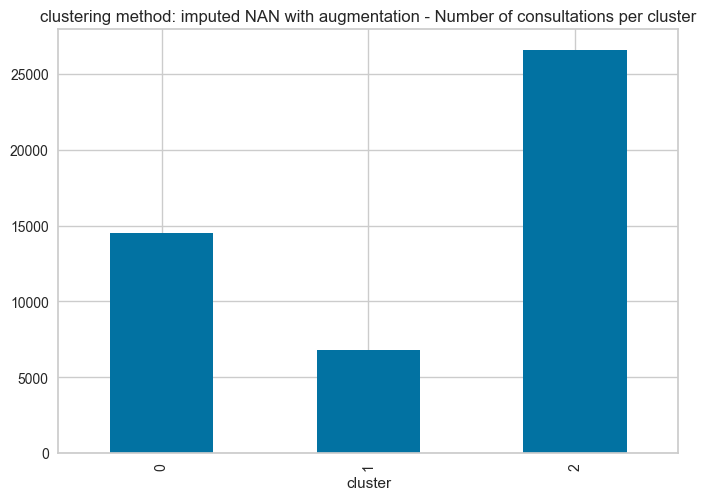

In [ ]:
# number of consultations per cluster for each clustering method
for i, cluster_data in enumerate(cluster_datasets):
    title = "clustering method: " + cluster_methods[i]
    
    cluster_data.groupby("cluster").size().plot(kind="bar", title=title + " - Number of consultations per cluster")
    plt.show()

<AxesSubplot:xlabel='cluster_method,cluster_result'>

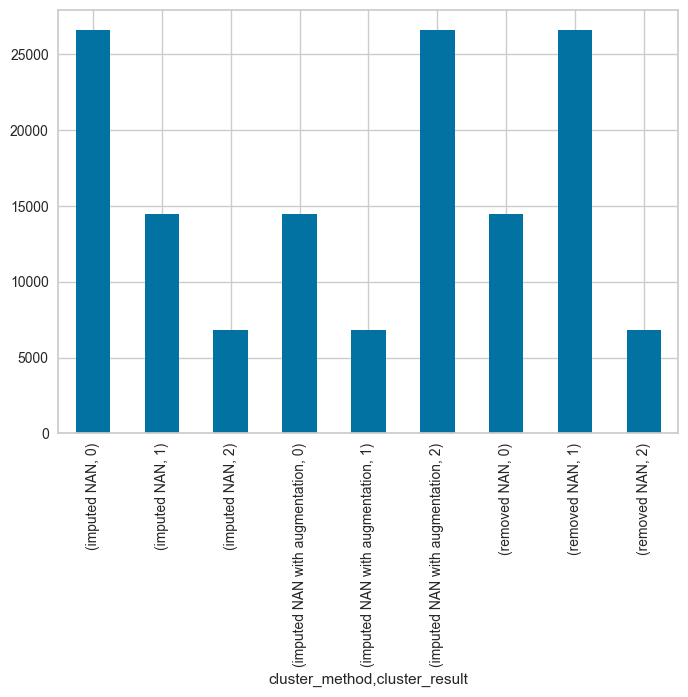

In [ ]:
# create df with all clustering results
cluster_results = pd.DataFrame()
for i, cluster_data in enumerate(cluster_datasets):
    cluster_results[cluster_methods[i]] = cluster_data["cluster"]


# give overview about amount of consultations per cluster
cluster_results_overview = cluster_results.melt(var_name ="cluster_method", value_name ="cluster_result")
cluster_results_overview.groupby(["cluster_method", "cluster_result"]).size().plot(kind="bar")

In [ ]:
consultations_per_cluster_for_each_method = cluster_results_overview.groupby(["cluster_method", "cluster_result"]).size().reset_index(name="number_consultations")
consultations_per_cluster_for_each_method["total_amount_consultations_per_method"] = [sum(consultations_per_cluster_for_each_method[consultations_per_cluster_for_each_method["cluster_method"] == method]["number_consultations"]) for method in consultations_per_cluster_for_each_method["cluster_method"]] 
consultations_per_cluster_for_each_method["percentage_consultations_threshold"] = consultations_per_cluster_for_each_method["number_consultations"] / consultations_per_cluster_for_each_method["total_amount_consultations_per_method"]  
consultations_per_cluster_for_each_method

,cluster_method,cluster_result,number_consultations,total_amount_consultations_per_method,percentage_consultations_threshold
0,imputed NAN,0,26597,47886,0.555423
1,imputed NAN,1,14493,47886,0.302656
2,imputed NAN,2,6796,47886,0.141920
3,imputed NAN with augmentation,0,14493,47886,0.302656
4,imputed NAN with augmentation,1,6796,47886,0.141920
5,imputed NAN with augmentation,2,26597,47886,0.555423
6,removed NAN,0,14493,47886,0.302656
7,removed NAN,1,26597,47886,0.555423
8,removed NAN,2,6796,47886,0.141920


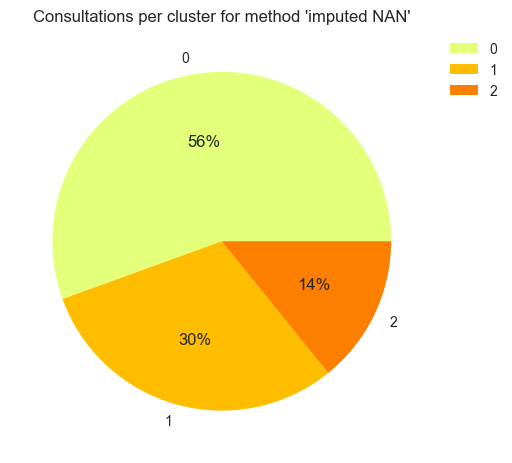

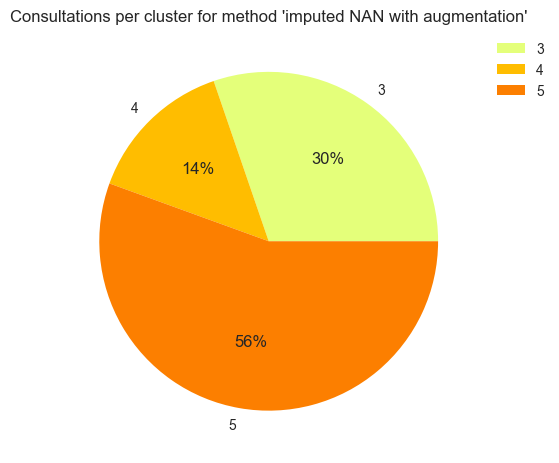

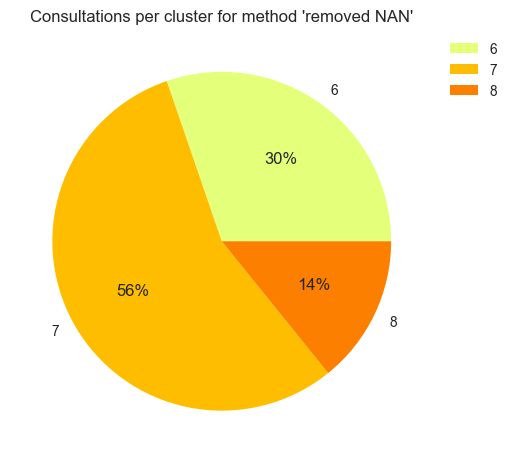

In [ ]:
for method in consultations_per_cluster_for_each_method["cluster_method"].unique():
    consultations_per_cluster_pie = consultations_per_cluster_for_each_method[consultations_per_cluster_for_each_method["cluster_method"] == method].plot(kind= "pie", y="percentage_consultations_threshold", autopct="%.0f%%", colormap="Wistia")
    consultations_per_cluster_pie.set_title("Consultations per cluster for method '"+method+"'")
    consultations_per_cluster_pie.legend(bbox_to_anchor= (1.01, 1))
    consultations_per_cluster_pie.set_ylabel('')

In [ ]:
# get movement of consultations between clusters from cluster method to cluster method
source = []
target = []
value = []
labels = []
source_count = 0
target_count = 0

for i, combi in enumerate(combinations):
    source_method_cluster_amount = len(cluster_results[combi[0]].unique())
    target_method_cluster_amount = len(cluster_results[combi[1]].unique())
    
    movement_between_methods = cluster_results.groupby(combi).size()

    source = source + [idx[0] + source_count for idx in movement_between_methods.index]
    target = target + [idx[1] + source_method_cluster_amount + target_count for idx in movement_between_methods.index]
    value = value + list(movement_between_methods.values)

    source_count = source_count + source_method_cluster_amount
    target_count = target_count + target_method_cluster_amount

    labels = labels + [combi[0] + " - cluster " + str(i) for i in range(source_method_cluster_amount) if not (combi[0] + " - cluster " + str(i) in labels)] + [combi[1] + " - cluster " + str(i) for i in range(target_method_cluster_amount) if  not (combi[1] + " - cluster " + str(i) in labels)]

In [ ]:
import plotly.graph_objects as go

fig = go.Figure(data=[go.Sankey(
    node = dict(
      pad = 15,
      thickness = 20,
      line = dict(color = "black", width = 0.5),
      label = labels,
      color = "blue"
    ),
    link = dict(
      source = source, # indices correspond to labels, eg A1, A2, A1, B1, ...
      target = target,
      value = value
  ))])

fig.update_layout(title_text="Movement of consultations between clusters depending on clustering method", font_size=10)
fig.show()

#### Takeaways
- the graph depicting the movement of consultations between clusters depending on the clustering method, reveals that all clustering methods strictly cluster the same data but label them into different clusters. What can be the reason for the change in cluster number? Since K-Means randomly inits the centroids for its K clusters, the number of the cluster does not matter. As a result, all clustering methods come to the same clustering result.
- 

# Demographic analysis of clusters

# Spatio-temporal analysis of clusters
- spatial dimension = patient's origin (or hf location)
- temporal dimension = consultation date

Reveal:
1. number of consultations in clusters over time and space
2. demographic (age and gender) in cluster over time and space
3. symptom composition in clusters over time and space
4. diagnosis composition in clusters over time and space (Did clustering lead to  or end of the branches of the underlying decision tree of CDSS?)

In [ ]:
# TODO engineer final data set with columns 
# key: consultation_date, village_name, village_long, village_lat, 
# number_consultations, age_avg, female_percentage, 
# number of 1 in symptom columns
# number of 1 in diagnosis columns

In [ ]:
for data in cluster_datasets:
    print(data.shape)

(47886, 4)
(47886, 16)
(47886, 28)


## Spatial analysis
1. patient's origin
2. hf location

In [ ]:
test = pd.merge(features_no_nan, rw_data[spatio_temporal_columns], left_index=True, right_index=True)

In [ ]:
test1 = test.groupby(["District", "Sector", "Cell", "Village", "longitude_village", "latitude_village", "cluster"]).size().reset_index(name="cluster_size")
test1

,District,Sector,Cell,Village,longitude_village,latitude_village,cluster,cluster_size
0,nyamasheke,bushekeri,buvungira,buhinga,29.080169,-2.418294,0,38
1,nyamasheke,bushekeri,buvungira,buhinga,29.080169,-2.418294,1,50
2,nyamasheke,bushekeri,buvungira,buhinga,29.080169,-2.418294,2,21
3,nyamasheke,bushekeri,buvungira,bushekeri,29.091001,-2.404073,0,6
4,nyamasheke,bushekeri,buvungira,bushekeri,29.091001,-2.404073,1,24
...,...,...,...,...,...,...,...,...
2902,rusizi,rwimbogo,ruganda,rubuye,29.003471,-2.647140,0,3
2903,rusizi,rwimbogo,ruganda,rubuye,29.003471,-2.647140,1,7
2904,rusizi,rwimbogo,ruganda,ruhinga,28.984867,-2.648469,0,11
2905,rusizi,rwimbogo,ruganda,ruhinga,28.984867,-2.648469,1,32


In [ ]:
if False:
    fig = px.scatter_geo(
        test1, 
        lat="latitude_village", 
        lon="longitude_village", 
        size="cluster_size", # size of markers, "pop" is one of the columns of gapminder
    )
    fig.show()

In [ ]:
import plotly.express as px
fig = px.scatter_mapbox(
    test1, 
    lat="latitude_village", 
    lon="longitude_village", 
    color="cluster", 
    size="cluster_size", 
    color_discrete_sequence=test1["cluster"].unique(),
    #color_continuous_scale=px.colors.cyclical.IceFire, 
    mapbox_style="stamen-terrain",
    size_max=15, zoom=10)
fig.show()

In [ ]:
test2 = test1.loc[test1.groupby(["District", "Sector", "Cell", "Village", "longitude_village", "latitude_village"], sort=False)["cluster_size"].idxmax()]
test2

,District,Sector,Cell,Village,longitude_village,latitude_village,cluster,cluster_size
1,nyamasheke,bushekeri,buvungira,buhinga,29.080169,-2.418294,1,50
4,nyamasheke,bushekeri,buvungira,bushekeri,29.091001,-2.404073,1,24
7,nyamasheke,bushekeri,buvungira,buvungira,29.092868,-2.417103,1,35
10,nyamasheke,bushekeri,buvungira,gasebeya,29.110375,-2.447158,1,24
13,nyamasheke,bushekeri,buvungira,gisakura,29.090935,-2.434478,1,36
...,...,...,...,...,...,...,...,...
2895,rusizi,rwimbogo,ruganda,cyunguriro,28.989045,-2.641548,1,17
2898,rusizi,rwimbogo,ruganda,musumba,28.995107,-2.659534,1,30
2901,rusizi,rwimbogo,ruganda,rubamba,28.998999,-2.632049,1,5
2903,rusizi,rwimbogo,ruganda,rubuye,29.003471,-2.647140,1,7


In [ ]:
fig = px.scatter_mapbox(
    test2, 
    lat="latitude_village", 
    lon="longitude_village", 
    color="cluster", 
    size="cluster_size", 
    mapbox_style="stamen-terrain",
    size_max=15, zoom=10)
fig.show()

In [ ]:
fig = px.density_mapbox(test, lon="longitude_village", lat="latitude_village", z="cluster", hover_name = "Village",
                                hover_data = ["Village"], radius=10,
                                center=dict(lon=30, lat=-1.9), zoom=7,
                                mapbox_style="stamen-terrain",
                                animation_frame = "medical_case_consultation_date_day")
fig.show()

## Spatial temporal analysis
Are there villages (= space unit) that had higher number of consultations then the threshold at a certain day, week or month (= time unit). The threshold is the percentage of consultations per cluster which is different for the clustering methods so the spatial temporal analysis is performed for each method. 

In [ ]:
features_spatial_temporal = pd.merge(features_no_nan, rw_data[spatio_temporal_columns], left_index=True, right_index=True)
from datetime import datetime

# Convert medical_case_consultation_date_day string to a datetime object
features_spatial_temporal["medical_case_consultation_date_day"] = [datetime.strptime(date, "%Y-%m-%d") for date in features_spatial_temporal["medical_case_consultation_date_day"]]

# Extract the year, month and week from the datetime object and add as additional columns
# note: week starts from week 0
features_spatial_temporal["temp"] = [(date.year, date.month, int(date.strftime("%U"))) for date in features_spatial_temporal["medical_case_consultation_date_day"]]
features_spatial_temporal[["medical_case_consultation_date_year", "medical_case_consultation_date_month", "medical_case_consultation_date_week"]] = features_spatial_temporal["temp"].apply(pd.Series)
features_spatial_temporal = features_spatial_temporal.drop("temp", axis=1)

features_spatial_temporal

,patient_age,patient_gender,CC33 - Fever or convulsions or lethargy - 7391,cluster,medical_case_consultation_date_day,health_facility_name,health_facility_longitude,health_facility_latitude,District,Sector,Cell,Village,longitude_village,latitude_village,medical_case_consultation_date_year,medical_case_consultation_date_month,medical_case_consultation_date_week
0,0.0,0.0,0.0,1,2021-12-01,RW Gihundwe CS,28.0,-2.0,rusizi,gihundwe,shagasha,karambo,28.940574,-2.497709,2021,12,48
0,0.0,0.0,0.0,1,2021-12-01,nyakarenzo,28.0,-2.0,rusizi,nyakarenzo,kabuye,nyamagana,28.903823,-2.552700,2021,12,48
0,5.0,1.0,0.0,0,2021-12-01,RW Gihundwe CS,28.0,-2.0,rusizi,gihundwe,shagasha,karambo,28.940574,-2.497709,2021,12,48
0,5.0,1.0,0.0,0,2021-12-01,nyakarenzo,28.0,-2.0,rusizi,nyakarenzo,kabuye,nyamagana,28.903823,-2.552700,2021,12,48
1,2.0,1.0,0.0,1,2021-12-01,RW Gihundwe CS,28.0,-2.0,rusizi,gihundwe,shagasha,karambo,28.940574,-2.497709,2021,12,48
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46370,9.0,1.0,0.0,2,2023-02-03,RW Rangiro CS,29.0,-2.0,nyamasheke,rangiro,jurwe,kibavu,29.142684,-2.406713,2023,2,5
46371,2.0,0.0,0.0,1,2023-02-07,RW Gisakura CS,29.0,-2.0,nyamasheke,mahembe,kagarama,mikingo,29.272525,-2.210330,2023,2,6
46372,5.0,0.0,0.0,0,2023-02-07,RW Nyakabuye CS,29.0,-2.0,rusizi,nyakabuye,nyabintare,barenga,29.062348,-2.558666,2023,2,6
46373,4.0,0.0,0.0,0,2023-02-07,RW Nyakabuye CS,29.0,-2.0,rusizi,nyakabuye,nyabintare,barenga,29.062348,-2.558666,2023,2,6


In [ ]:
features_at_village_every_week = features_spatial_temporal.groupby(["District", "Sector", "Cell", "Village", "longitude_village", "latitude_village","medical_case_consultation_date_year", "medical_case_consultation_date_week", "cluster"]).size().reset_index(name="cluster_size")
features_at_village_every_month = features_spatial_temporal.groupby(["District", "Sector", "Cell", "Village", "longitude_village", "latitude_village","medical_case_consultation_date_year", "medical_case_consultation_date_month", "cluster"]).size().reset_index(name="cluster_size")

In [ ]:
consultations_per_week = features_at_village_every_week.groupby(["District", "Sector", "Cell", "Village", "longitude_village", "latitude_village","medical_case_consultation_date_year", "medical_case_consultation_date_week"])["cluster_size"].sum().reset_index(name="number_consultations_per_village_per_week")
features_at_village_every_week = features_at_village_every_week.merge(
    consultations_per_week, 
    on=["District", "Sector", "Cell", "Village", "longitude_village", "latitude_village","medical_case_consultation_date_year", "medical_case_consultation_date_week"], 
    how="left")

In [ ]:
features_at_village_every_week["percentage_consultations_per_village_per_week"] = features_at_village_every_week["cluster_size"] / features_at_village_every_week["number_consultations_per_village_per_week"] # note: cluster_size == number consultations
features_at_village_every_week

,District,Sector,Cell,Village,longitude_village,latitude_village,medical_case_consultation_date_year,medical_case_consultation_date_week,cluster,cluster_size,number_consultations_per_village_per_week,percentage_consultations_per_village_per_week
0,nyamasheke,bushekeri,buvungira,buhinga,29.080169,-2.418294,2022,3,1,1,1,1.000000
1,nyamasheke,bushekeri,buvungira,buhinga,29.080169,-2.418294,2022,35,1,2,3,0.666667
2,nyamasheke,bushekeri,buvungira,buhinga,29.080169,-2.418294,2022,35,2,1,3,0.333333
3,nyamasheke,bushekeri,buvungira,buhinga,29.080169,-2.418294,2022,36,1,1,1,1.000000
4,nyamasheke,bushekeri,buvungira,buhinga,29.080169,-2.418294,2022,37,0,1,2,0.500000
...,...,...,...,...,...,...,...,...,...,...,...,...
32493,rusizi,rwimbogo,ruganda,ruhinga,28.984867,-2.648469,2022,52,0,1,3,0.333333
32494,rusizi,rwimbogo,ruganda,ruhinga,28.984867,-2.648469,2022,52,1,2,3,0.666667
32495,rusizi,rwimbogo,ruganda,ruhinga,28.984867,-2.648469,2023,4,1,3,3,1.000000
32496,rusizi,rwimbogo,ruganda,ruhinga,28.984867,-2.648469,2023,5,1,2,2,1.000000


In [ ]:
# check if percentage of number of consultations per village and per week is above thresholds
minimum_number_of_consultations_per_week = features_at_village_every_week["cluster"].nunique()*2 # arbitrarily chosen threshold in order to ensure significance of difference
threshold_per_cluster = consultations_per_cluster_for_each_method[consultations_per_cluster_for_each_method["cluster_method"] == "removed NAN"]

features_at_village_every_week = features_at_village_every_week.merge(threshold_per_cluster[["cluster_result", "percentage_consultations_threshold"]], left_on="cluster", right_on="cluster_result", how="left")
features_at_village_every_week 

,District,Sector,Cell,Village,longitude_village,latitude_village,medical_case_consultation_date_year,medical_case_consultation_date_week,cluster,cluster_size,number_consultations_per_village_per_week,percentage_consultations_per_village_per_week,cluster_result,percentage_consultations_threshold
0,nyamasheke,bushekeri,buvungira,buhinga,29.080169,-2.418294,2022,3,1,1,1,1.000000,1,0.555423
1,nyamasheke,bushekeri,buvungira,buhinga,29.080169,-2.418294,2022,35,1,2,3,0.666667,1,0.555423
2,nyamasheke,bushekeri,buvungira,buhinga,29.080169,-2.418294,2022,35,2,1,3,0.333333,2,0.141920
3,nyamasheke,bushekeri,buvungira,buhinga,29.080169,-2.418294,2022,36,1,1,1,1.000000,1,0.555423
4,nyamasheke,bushekeri,buvungira,buhinga,29.080169,-2.418294,2022,37,0,1,2,0.500000,0,0.302656
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32493,rusizi,rwimbogo,ruganda,ruhinga,28.984867,-2.648469,2022,52,0,1,3,0.333333,0,0.302656
32494,rusizi,rwimbogo,ruganda,ruhinga,28.984867,-2.648469,2022,52,1,2,3,0.666667,1,0.555423
32495,rusizi,rwimbogo,ruganda,ruhinga,28.984867,-2.648469,2023,4,1,3,3,1.000000,1,0.555423
32496,rusizi,rwimbogo,ruganda,ruhinga,28.984867,-2.648469,2023,5,1,2,2,1.000000,1,0.555423


In [ ]:
features_at_village_every_week["passed_minimum_number_of_consultations_per_week"] = features_at_village_every_week["number_consultations_per_village_per_week"] > minimum_number_of_consultations_per_week
print(features_at_village_every_week["passed_minimum_number_of_consultations_per_week"].sum(), "village week combis pass minimum_number_of_consultations_per_week of", minimum_number_of_consultations_per_week,"\n This accounts for",features_at_village_every_week["passed_minimum_number_of_consultations_per_week"].sum()/features_at_village_every_week["passed_minimum_number_of_consultations_per_week"].count())

features_at_village_every_week["passed_percentage_consultations_threshold"] = features_at_village_every_week["percentage_consultations_per_village_per_week"] > features_at_village_every_week["percentage_consultations_threshold"]
print(features_at_village_every_week["passed_percentage_consultations_threshold"].sum(), "village week combis pass percentage_consultations_threshold of their respective cluster","\n This accounts for",features_at_village_every_week["passed_percentage_consultations_threshold"].sum()/features_at_village_every_week["passed_percentage_consultations_threshold"].count())
features_at_village_every_week

2167 village week combis pass minimum_number_of_consultations_per_week of 6 
 This accounts for 0.06668102652470921
25439 village week combis pass percentage_consultations_threshold of their respective cluster 
 This accounts for 0.7827866330235707


,District,Sector,Cell,Village,longitude_village,latitude_village,medical_case_consultation_date_year,medical_case_consultation_date_week,cluster,cluster_size,number_consultations_per_village_per_week,percentage_consultations_per_village_per_week,cluster_result,percentage_consultations_threshold,passed_minimum_number_of_consultations_per_week,passed_percentage_consultations_threshold
0,nyamasheke,bushekeri,buvungira,buhinga,29.080169,-2.418294,2022,3,1,1,1,1.000000,1,0.555423,False,True
1,nyamasheke,bushekeri,buvungira,buhinga,29.080169,-2.418294,2022,35,1,2,3,0.666667,1,0.555423,False,True
2,nyamasheke,bushekeri,buvungira,buhinga,29.080169,-2.418294,2022,35,2,1,3,0.333333,2,0.141920,False,True
3,nyamasheke,bushekeri,buvungira,buhinga,29.080169,-2.418294,2022,36,1,1,1,1.000000,1,0.555423,False,True
4,nyamasheke,bushekeri,buvungira,buhinga,29.080169,-2.418294,2022,37,0,1,2,0.500000,0,0.302656,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32493,rusizi,rwimbogo,ruganda,ruhinga,28.984867,-2.648469,2022,52,0,1,3,0.333333,0,0.302656,False,True
32494,rusizi,rwimbogo,ruganda,ruhinga,28.984867,-2.648469,2022,52,1,2,3,0.666667,1,0.555423,False,True
32495,rusizi,rwimbogo,ruganda,ruhinga,28.984867,-2.648469,2023,4,1,3,3,1.000000,1,0.555423,False,True
32496,rusizi,rwimbogo,ruganda,ruhinga,28.984867,-2.648469,2023,5,1,2,2,1.000000,1,0.555423,False,True


## Points in time and space with significantly higher cluster presence then usual
To do so, filter for points in time and space when percentage_consultaton is significantly higher than the percentage_consultaton_threshold by doing one sided gaussian test:
- H0: percentage_consultaton <= percentage_consultaton_thrshold 
- H1: percentage_consultaton > percentage_consultaton_thrshold

In [ ]:
#get interesting features which are features above thresholds
interesting_features_at_village_every_week = features_at_village_every_week[(features_at_village_every_week["passed_percentage_consultations_threshold"] & features_at_village_every_week["passed_minimum_number_of_consultations_per_week"])]
interesting_features_at_village_every_week["year-week"] = interesting_features_at_village_every_week["medical_case_consultation_date_year"].astype(str) + " - " + interesting_features_at_village_every_week["medical_case_consultation_date_week"].astype(str)
interesting_features_at_village_every_week = interesting_features_at_village_every_week.sort_values(by=["medical_case_consultation_date_year","medical_case_consultation_date_week"])

C:\Users\sidla\AppData\Local\Temp\ipykernel_2480\1949632370.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
fig = px.density_mapbox(interesting_features_at_village_every_week, lon="longitude_village", lat="latitude_village", z="cluster", hover_name = "Village",
                                hover_data = ["Village", "percentage_consultations_per_village_per_week", "cluster_size"], radius=10,
                                center=dict(lon=30, lat=-1.9), zoom=7,
                                mapbox_style="stamen-terrain",
                                animation_frame = "year-week")
fig.show()

In [ ]:
# examining the clusters at nteresting space and time points
features_interestng_space_time_points = features_no_nan.filter(items=interesting_features_at_village_every_week.index, axis=0)
features_interestng_space_time_points

C:\Users\sidla\AppData\Local\Temp\ipykernel_2480\2039497964.py:2: FutureWarning:

reindexing with a non-unique Index is deprecated and will raise in a future version.



ValueError: cannot reindex on an axis with duplicate labels

## Takeaways
- percentage of consultations in cluster 0 is never above threshold 0.302656 for any week in any village